# Homework #3
- submit your code here for problems 2 and 3

* copy this file into your drive
```
File -> Save a copy in Drive
```
* write the code in the cells provided for each questions
* <font color="red"> DO NOT DELETE or MODIFY </font> the first line of each cell (will be used to mark your homework, otherwise you will get 0)
* <font color="red"> DO NOT DELETE or MODIFY </font> function name, function input, and function output (return). Otherwise, you will get 0.
* <font color="red"> DO NOT ADD </font> anything outside the function (of the homeworkx_x cells). Otherwise, you will get 0.
* Make sure homework2_1-2_3 can run properly and can be tested with any image (not rely just on your images); otherwise, your homework will not be marked.


In [9]:
!wget https://drive.google.com/uc?id=1o0UMPTyUFzX9CaQp-BwYXgkCho1Zo6yL  -O kitty55.png
!wget https://drive.google.com/uc?id=1B2DdZ4MPuCcEr9sXSy9g5bR9nD7veBOR  -O pyri.zip
!wget https://drive.google.com/uc?id=15Qs_2kJ7scBEDLc8YQ2bi0U6PKiLpnmn -O gemini.jpg
!unzip pyri.zip

--2024-11-29 15:38:02--  https://drive.google.com/uc?id=1o0UMPTyUFzX9CaQp-BwYXgkCho1Zo6yL
Resolving drive.google.com (drive.google.com)... 74.125.202.102, 74.125.202.138, 74.125.202.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.202.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1o0UMPTyUFzX9CaQp-BwYXgkCho1Zo6yL [following]
--2024-11-29 15:38:02--  https://drive.usercontent.google.com/download?id=1o0UMPTyUFzX9CaQp-BwYXgkCho1Zo6yL
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.206.132, 2607:f8b0:4001:c2f::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.206.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 112875 (110K) [image/png]
Saving to: ‘kitty55.png’

kitty55.png         100%[===================>] 110.23K  --.-KB/s    in 0.001s  

2024-11-29 15:38:04 (90.0 MB/s) - ‘kitty55.png’ 

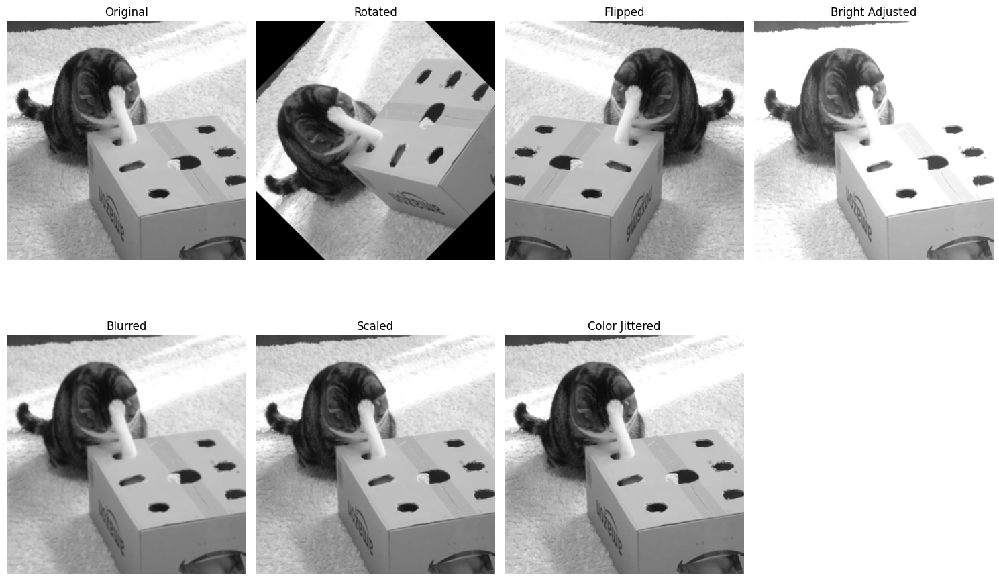

In [10]:
import imutils
import cv2
import numpy as np
import matplotlib.pyplot as plt


def rotate_image(image, angle):
    return imutils.rotate(image, angle=angle)

def flip_image(image, flip_code):
    return cv2.flip(image, flipCode=flip_code)

def adjust_brightness(image, alpha, beta):
    return cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

def gaussian_blur(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

def scale_image(image, scale_percent):
    width = int(image.shape[1] * scale_percent / 100)
    height = int(image.shape[0] * scale_percent / 100)
    return cv2.resize(image, (width, height))

def color_jitter(image, brightness=0.5, contrast=0.5, saturation=0.5):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV).astype(np.float32)
    hsv[..., 1] *= 1 + np.random.uniform(-saturation, saturation)
    hsv[..., 2] *= 1 + np.random.uniform(-brightness, brightness)
    hsv = np.clip(hsv, 0, 255)
    return cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2BGR)

image = cv2.imread("kitty55.png")

# Augmented Images
rotated = rotate_image(image, 45)
flipped = flip_image(image, 1)
bright_adjusted = adjust_brightness(image, 1.2, 30)
blurred = gaussian_blur(image, 5)
scaled = scale_image(image, 80)
color_jittered = color_jitter(image)

# Display Images
images = [image, rotated, flipped, bright_adjusted, blurred, scaled, color_jittered]
titles = ['Original', 'Rotated', 'Flipped', 'Bright Adjusted', 'Blurred', 'Scaled', 'Color Jittered']

plt.figure(figsize=(15, 10))
for i in range(len(images)):
    plt.subplot(2, 4, i + 1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


In [78]:
# homework3
import cv2
import numpy as np
# import your library here ... try not to display anything in the function

def homework3_2_count_spores(image_bgr):
    """
    Input: image_bgr - A BGR image read by OpenCV
    Output:
        (1) resulted_image - A BGR image with counted spores labeled
        (2) num_count - Number of spores detected
    """
    # Convert to grayscale for processing
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use binary thresholding to segment spores
    _, threshold = cv2.threshold(blurred, 50, 255, cv2.THRESH_BINARY_INV)

    # Perform morphological operations to merge close contours
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))  # Larger kernel for merging
    merged = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

    # Find contours on the processed (merged) image
    contours, _ = cv2.findContours(merged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the original image for drawing
    result_image = image_bgr.copy()
    num_count = 0

    # Iterate through contours and count spores
    for contour in contours:
        # Filter small noise by setting a minimum contour area
        area = cv2.contourArea(contour)
        if area > 200:  # Adjust this threshold based on the size of your spores
            num_count += 1
            # Draw bounding boxes around merged spores
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(result_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
            # Label each spore
            cv2.putText(result_image, f"{num_count}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    return result_image, num_count


def homework3_3_gemini_stars(image_bgr):
    """
    Input: image_bgr - A BGR image read by OpenCV
    Output: stars_of_gemini - An image showing only the brightened stars of Gemini
    """
    # Convert image to grayscale
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to isolate bright stars
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological operations (erosion followed by dilation)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    eroded = cv2.erode(binary, kernel, iterations=1)
    dilated = cv2.dilate(eroded, kernel, iterations=2)

    # Find contours to identify connected components
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a mask to keep only stars larger than a size threshold
    size_threshold = 45  # Adjust this value based on the image scale and desired star size
    filtered_mask = np.zeros_like(dilated)

    for contour in contours:
        area = cv2.contourArea(contour)
        if area >= size_threshold:
            cv2.drawContours(filtered_mask, [contour], -1, 255, thickness=cv2.FILLED)

    # Mask the original image with the filtered binary image
    stars_of_gemini = cv2.bitwise_and(image_bgr, image_bgr, mask=filtered_mask)

    return stars_of_gemini




pyri01.jpg 18


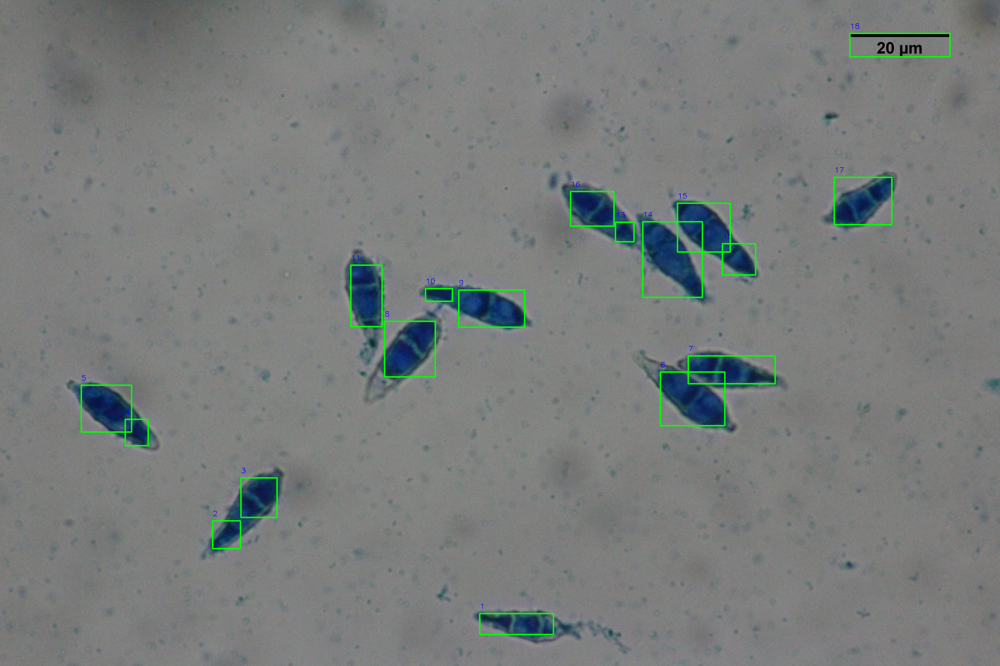

pyri02.jpg 23


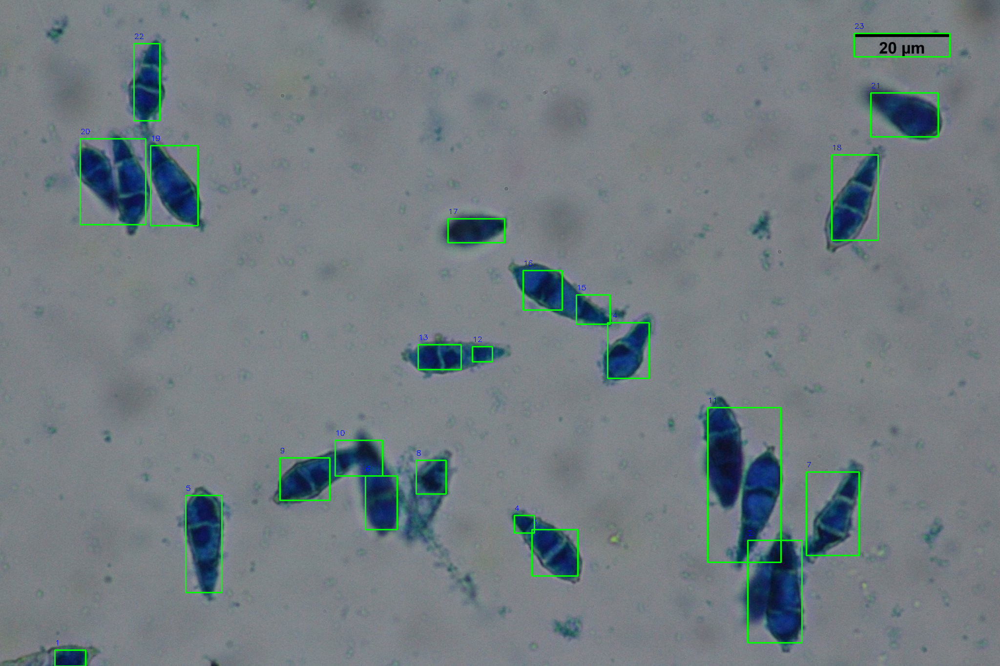

pyri03.jpg 60


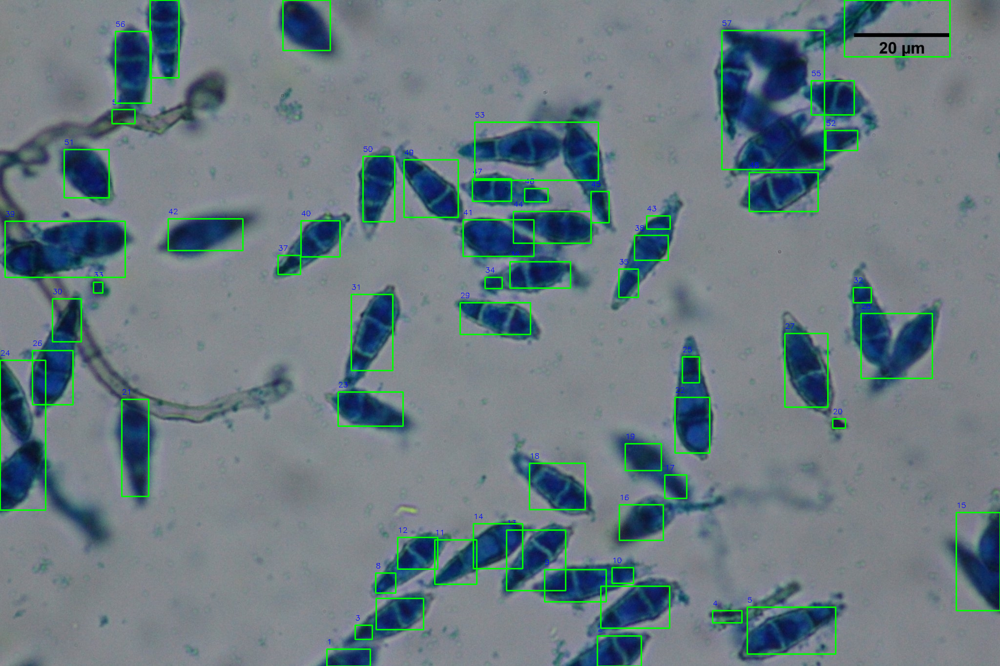

pyri04.jpg 25


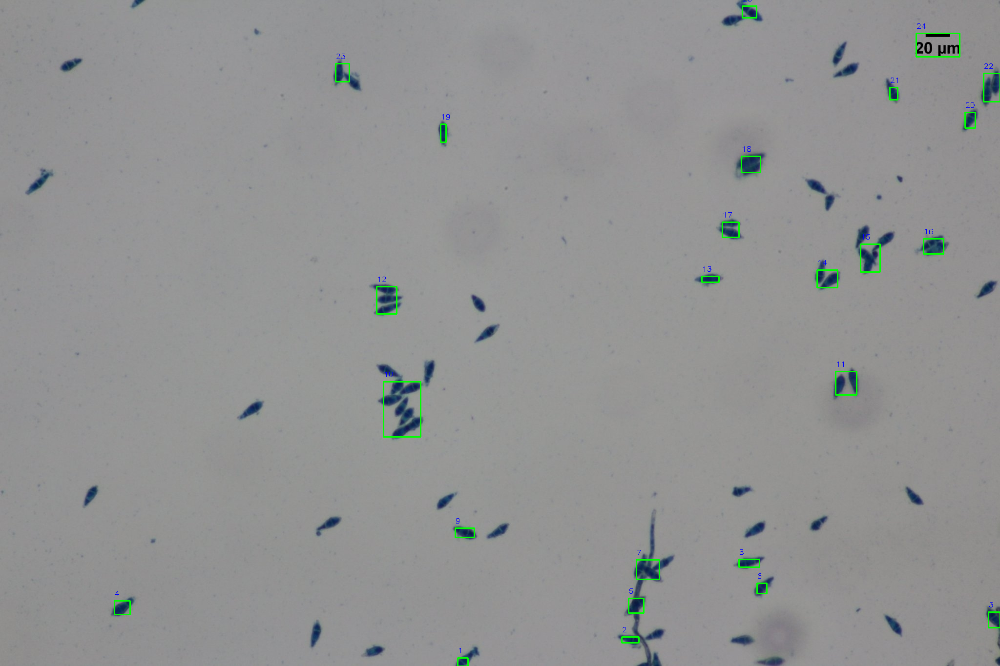

In [42]:
# write your own functions here (if needed)
from google.colab.patches import cv2_imshow

# Example usage
image_paths = ['pyri01.jpg', 'pyri02.jpg', 'pyri03.jpg', 'pyri04.jpg']

for path in image_paths:
    image = cv2.imread(path)
    result_img, num_count = homework3_2_count_spores(image)

    print(path, num_count)
    cv2_imshow(result_img)

In [47]:
!gdown 1F4gZPU5KUboFBJ7cVPHIrJyfrRcwJj92

Downloading...
From: https://drive.google.com/uc?id=1F4gZPU5KUboFBJ7cVPHIrJyfrRcwJj92
To: /content/gemini_zodiac.jpg
100% 49.6k/49.6k [00:00<00:00, 86.0MB/s]


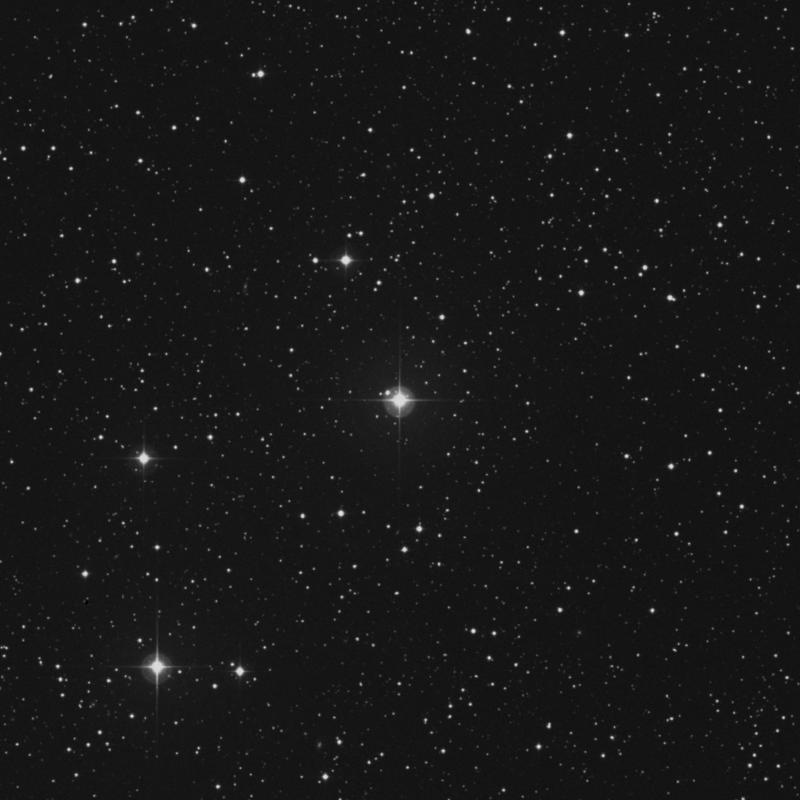

In [49]:
image = cv2.imread("gemini_zodiac.jpg")
cv2_imshow(image)

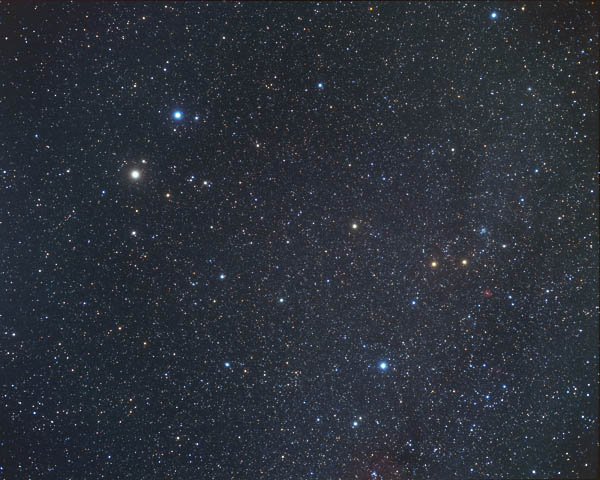

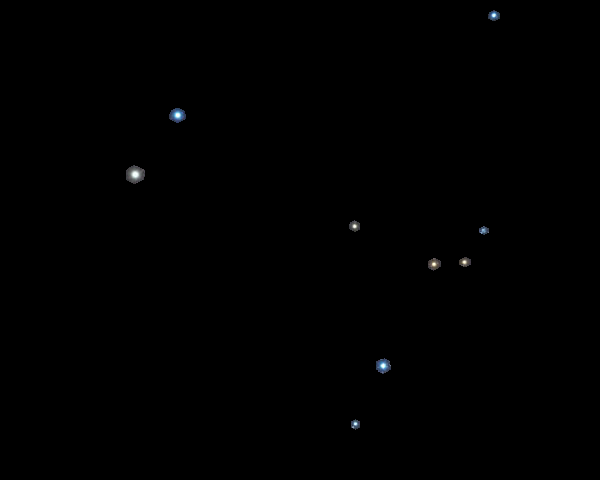

In [79]:
import cv2

# Load the input image
input_image = cv2.imread('gemini.jpg')  # Replace with the actual image file path

# Call the function to process the image
result_image = homework3_3_gemini_stars(input_image)

# Display the result
cv2_imshow(input_image)
cv2_imshow(result_image)
